In [1]:
import numpy as np
import pandas as pd
import plotly.graph_objs as go

In [2]:
# Load data and clean up

df_phone = pd.read_csv("data/lyca_bg/LycaBG_phone.csv")
df_server = pd.read_csv("data/lyca_bg/LycaBG_server.csv")
trimmed_columns = {col: col.strip() for col in df_server.columns}
df_server = df_server.rename(columns=trimmed_columns)
trimmed_columns = {col: col.strip() for col in df_phone.columns}
df_phone = df_phone.rename(columns=trimmed_columns)
df_merged = df_phone.merge(df_server, how="inner", on="Message id")
df_merged.sort_values(by="Time_y")
df_merged["Time_y"] = df_merged["Time_y"].astype(int)
df_merged["time_difference_y"] = df_merged['Time_y'].diff()
df_merged.sort_values(by="Time_x")
df_merged["Time_x"] = df_merged["Time_x"].astype(int)
df_merged["time_difference_x"] = df_merged['Time_x'].diff()
df_merged["Sender Port_x"] = df_merged["Sender Port_x"].astype(int)
df_merged["Sender Port_y"] = df_merged["Sender Port_y"].astype(int)


print(f"Number of rows {len(df_merged.index)}")
# Visualize 

# Create a line chart using Plotly
df = df_merged


Number of rows 316351


In [3]:
fig = go.Figure()

# Add a line trace
fig.add_trace(go.Scatter(x=df_merged['Time_x'], y=df_merged['Sender Port_y'], mode='lines+markers', name='Port_y'))

# Update layout
fig.update_layout(title='Line and Marker Chart of Time and Port Number of Lyca Belgium',
                  xaxis_title='Time',
                  yaxis_title='Port Number')

# Show the plot
fig.show()

In [4]:
print(df['Sender Port_y'].min())
print(df['Sender Port_y'].max())
print(len(df['Sender Port_y'].unique()))
df['Sender Port_y'].value_counts()

2048
65535
37412


Sender Port_y
12183    29
2264     27
22004    26
60557    26
24301    25
         ..
34660     1
8285      1
20055     1
19450     1
41137     1
Name: count, Length: 37412, dtype: int64

In [5]:
l = [[0]]
THRESHOLD = 1
prev = df.iloc[0]
for index, row in df.iterrows():
    

    if abs(row["Sender Port_y"] - prev["Sender Port_y"]) > THRESHOLD or row["Time_x"] - prev["Time_x"] > 10000:
        l[-1].append(index -1)
        l.append([index])


    prev = row
len(l)

316284

In [6]:
grouped = df.groupby(["Sender Port_x", "Sender Port_y"],as_index=False).size()
grouped[grouped['size'] >1]

,Sender Port_x,Sender Port_y,size
5431,2128,37479,2
52332,11717,32040,2
68320,15014,23813,2
68934,15141,22390,2
71653,15681,34768,2
80883,17556,4459,2
85833,18554,33752,2
102208,21887,51273,2
137656,29118,23665,2
149733,31600,64757,2


/tmp/ipykernel_4092686/3872311998.py:8: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



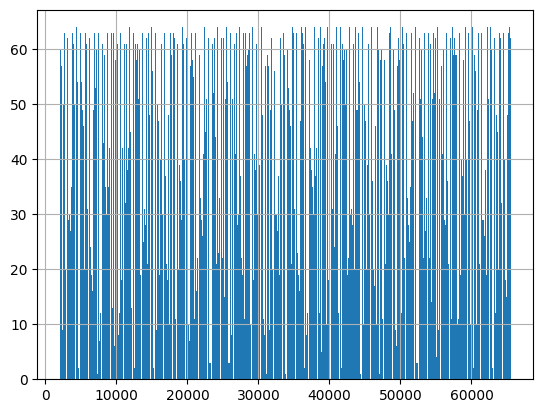

In [7]:
df2 = pd.DataFrame({"data":sorted(df['Sender Port_y'].unique())})
hist = df2['data'].hist(bins=1000)
fig = hist.get_figure()
# fig.set_xlabel("Port Number")
# fig.set_ylabel("Frequency")
# fig.set_title("Histogram of Port Number Frequency on Odido NL")
# fig.savefig("figures/odido_hist_1000_bins.png")
fig.show()